<a href="https://colab.research.google.com/github/the-madhankumar/NewYorkCityTaxi---EDA/blob/main/NewYorkCityTaxiTrip.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install matplotlib pandas numpy seaborn plotly

In [111]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [112]:
df = pd.read_csv("/content/New York City Taxi Trip Duration- train.csv")

In [113]:
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [114]:
df.shape

(1458644, 11)

In [115]:
df.isnull().sum()

,0
id,0
vendor_id,0
pickup_datetime,0
dropoff_datetime,0
passenger_count,0
pickup_longitude,0
pickup_latitude,0
dropoff_longitude,0
dropoff_latitude,0
store_and_fwd_flag,0


In [116]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1458644 non-null  object 
 1   vendor_id           1458644 non-null  int64  
 2   pickup_datetime     1458644 non-null  object 
 3   dropoff_datetime    1458644 non-null  object 
 4   passenger_count     1458644 non-null  int64  
 5   pickup_longitude    1458644 non-null  float64
 6   pickup_latitude     1458644 non-null  float64
 7   dropoff_longitude   1458644 non-null  float64
 8   dropoff_latitude    1458644 non-null  float64
 9   store_and_fwd_flag  1458644 non-null  object 
 10  trip_duration       1458644 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 122.4+ MB


In [117]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df['dropoff_datetime'] = pd.to_datetime(df['dropoff_datetime'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1458644 non-null  object        
 1   vendor_id           1458644 non-null  int64         
 2   pickup_datetime     1458644 non-null  datetime64[ns]
 3   dropoff_datetime    1458644 non-null  datetime64[ns]
 4   passenger_count     1458644 non-null  int64         
 5   pickup_longitude    1458644 non-null  float64       
 6   pickup_latitude     1458644 non-null  float64       
 7   dropoff_longitude   1458644 non-null  float64       
 8   dropoff_latitude    1458644 non-null  float64       
 9   store_and_fwd_flag  1458644 non-null  object        
 10  trip_duration       1458644 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(3), object(2)
memory usage: 122.4+ MB


In [118]:
df.sample(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
823924,id3709503,1,2016-01-04 20:46:44,2016-01-04 20:51:09,1,-73.990219,40.737823,-73.999588,40.743885,N,265
295628,id3245035,2,2016-02-15 21:09:03,2016-02-15 21:46:35,5,-73.966644,40.773048,-73.862717,40.676796,N,2252
781405,id0409288,2,2016-05-30 13:02:54,2016-05-30 13:10:43,1,-73.968819,40.754971,-73.992569,40.737419,N,469
818690,id0208809,2,2016-03-14 08:56:38,2016-03-14 09:09:30,1,-73.978447,40.745037,-73.962158,40.764580,N,772
683204,id2934125,2,2016-03-09 22:55:57,2016-03-09 23:10:49,1,-73.954407,40.763908,-73.975471,40.789726,N,892


In [119]:
df.describe()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1458644,1458644,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,2016-04-01 10:10:24.940037120,2016-04-01 10:26:24.432310528,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
min,1.000000e+00,2016-01-01 00:00:17,2016-01-01 00:03:31,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,2016-02-17 16:46:04.249999872,2016-02-17 17:05:32.500000,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,2016-04-01 17:19:40,2016-04-01 17:35:12,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2016-05-15 03:56:08.750000128,2016-05-15 04:10:51.750000128,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,2016-06-30 23:59:39,2016-07-01 23:02:03,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06
std,4.987772e-01,NaN,NaN,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03


In [120]:
df['trip_duration_min'] = df['trip_duration'] / 60
df['pickup_hour'] = df['pickup_datetime'].dt.hour
df['pickup_daysOfWeek'] = df['pickup_datetime'].dt.dayofweek
df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,trip_duration_min,pickup_hour,pickup_daysOfWeek
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,7.583333,17,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,11.050000,0,6
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,35.400000,11,1
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,7.150000,19,2
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,7.250000,13,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,778,12.966667,13,4
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,655,10.916667,7,6
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,764,12.733333,6,4
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,373,6.216667,15,1


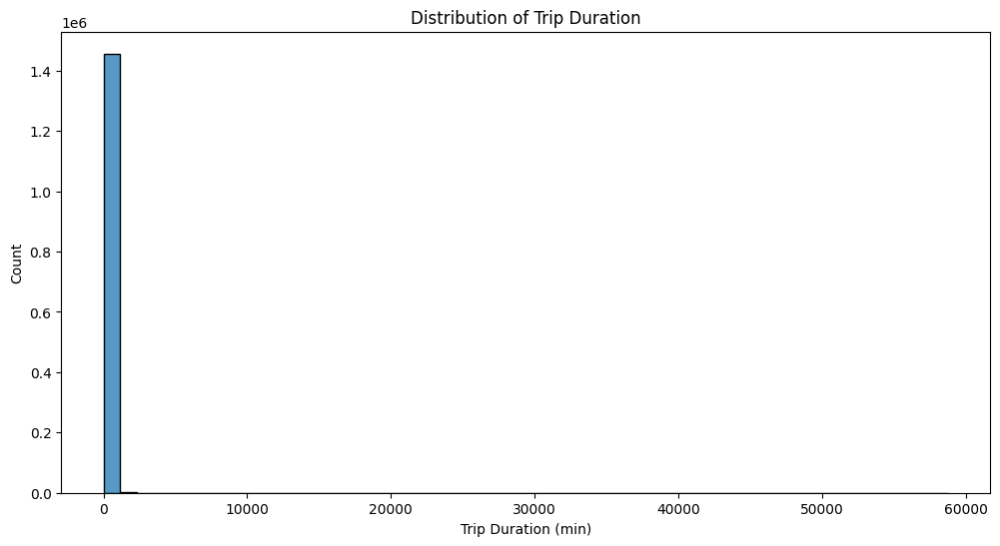

In [121]:
plt.figure(figsize=(12,6))
sns.histplot(df['trip_duration_min'], bins = 50)
plt.xlabel('Trip Duration (min)')
plt.ylabel('Count')
plt.title('Distribution of Trip Duration')
plt.show()

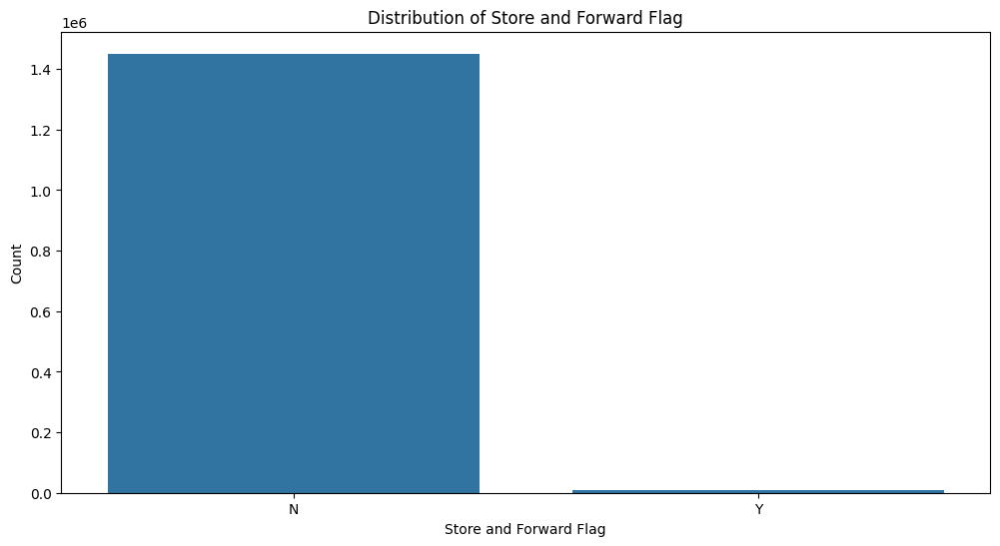

In [122]:
plt.figure(figsize=(12,6))
sns.countplot(x='store_and_fwd_flag', data = df)
plt.xlabel('Store and Forward Flag')
plt.ylabel('Count')
plt.title('Distribution of Store and Forward Flag')
plt.show()

In [123]:
fig = px.histogram(df, x='pickup_hour', color='passenger_count', title='Pickup Hour Distribution')
fig.show()

In [124]:
fig = px.histogram(df['passenger_count'], title='Distribution of Passenger Count')
fig.show()

In [125]:
avg_trip_duration_by_hour = df.groupby('pickup_hour')['trip_duration_min'].mean()

fig = px.line(avg_trip_duration_by_hour,
              x = avg_trip_duration_by_hour.index,
              y = avg_trip_duration_by_hour.values,
              title='Average Trip Duration by Hour')
fig.show()

In [126]:
fig = px.pie(df, names='pickup_daysOfWeek', title='Pickup Days of Week')
fig.show()

In [127]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{'type': 'domain'}, {'type': 'polar'}],
           [{'colspan': 2}, None]]
)

dayofweek_counts = df['pickup_daysOfWeek'].value_counts()

fig.add_trace(go.Pie(
    values=dayofweek_counts.values,
    labels=dayofweek_counts.index.tolist(),
    title='Pickup Days of Week'
), row=1, col=1)

day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

fig.add_trace(go.Barpolar(
    r=dayofweek_counts.values,
    theta=day_names
), row=1, col=2)

fig.add_trace(go.Histogram(
    x=df['pickup_daysOfWeek'],
    nbinsx=25
), row=2, col=1)

fig.update_layout(
    title='Pickup Counts by Day of the Week',
    width=1000, height=800,
)

fig.show()


<Axes: >

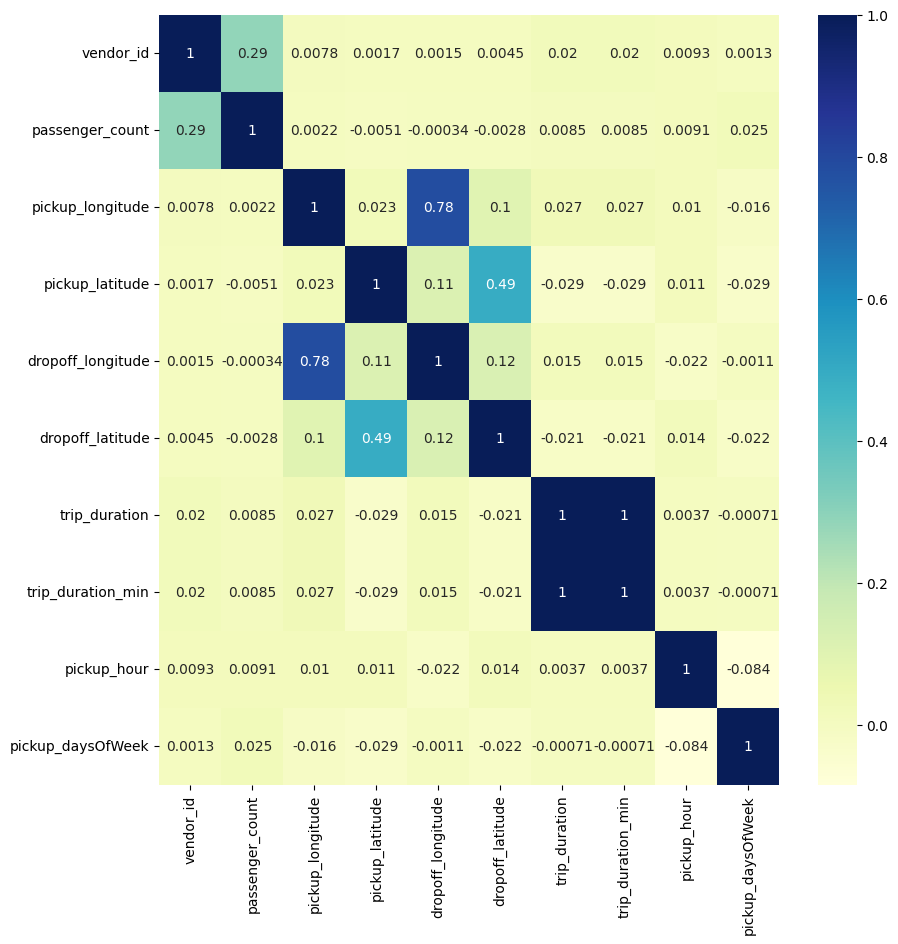

In [128]:
numeric_df = df._get_numeric_data()
plt.figure(figsize=(10,10))
sns.heatmap(numeric_df.corr(), annot=True, cmap="YlGnBu")

In [129]:
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,trip_duration_min,pickup_hour,pickup_daysOfWeek
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,7.583333,17,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,11.050000,0,6
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,35.400000,11,1
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,7.150000,19,2
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,7.250000,13,5


In [130]:
def convertFlag(x):
    if(x == 'N'): return 1
    return 0

df['store_and_fwd_flag'] = df['store_and_fwd_flag'].apply(convertFlag)
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,trip_duration_min,pickup_hour,pickup_daysOfWeek
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,1,455,7.583333,17,0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,1,663,11.050000,0,6
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,1,2124,35.400000,11,1
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,1,429,7.150000,19,2
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,1,435,7.250000,13,5


In [131]:
tempdf = pd.concat([
    df['vendor_id'].value_counts().rename('vendor_id_count'),
    df['store_and_fwd_flag'].value_counts().rename('store_and_fwd_flag_count')
], axis=1)

tempdf

,vendor_id_count,store_and_fwd_flag_count
2,780302.0,NaN
1,678342.0,1450599.0
0,NaN,8045.0


In [132]:
df.drop(columns=['id', 'pickup_datetime', 'dropoff_datetime'], inplace=True)

In [133]:
df

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,trip_duration_min,pickup_hour,pickup_daysOfWeek
0,2,1,-73.982155,40.767937,-73.964630,40.765602,1,455,7.583333,17,0
1,1,1,-73.980415,40.738564,-73.999481,40.731152,1,663,11.050000,0,6
2,2,1,-73.979027,40.763939,-74.005333,40.710087,1,2124,35.400000,11,1
3,2,1,-74.010040,40.719971,-74.012268,40.706718,1,429,7.150000,19,2
4,2,1,-73.973053,40.793209,-73.972923,40.782520,1,435,7.250000,13,5
...,...,...,...,...,...,...,...,...,...,...,...
1458639,2,4,-73.982201,40.745522,-73.994911,40.740170,1,778,12.966667,13,4
1458640,1,1,-74.000946,40.747379,-73.970184,40.796547,1,655,10.916667,7,6
1458641,2,1,-73.959129,40.768799,-74.004433,40.707371,1,764,12.733333,6,4
1458642,1,1,-73.982079,40.749062,-73.974632,40.757107,1,373,6.216667,15,1


In [155]:
def detect_multiconlinearity(df, threshold=0.80, targetCol='trip_duration'):
    Correlation = dict()
    corr_matrix = df.corr()

    cols = []
    rows = []
    for i in df.columns:
        if i != targetCol:
            cols.append(i)
            rows.append(i)

    for i in rows:
        currentData = corr_matrix.loc[i, targetCol]
        if currentData >= threshold:
            if i not in Correlation:
                Correlation[i] = []
            Correlation[i].append({targetCol: f'{currentData}'})

    return Correlation


In [156]:
Correlated_data = detect_multiconlinearity(df)

In [157]:
Correlated_data

{'trip_duration_min': [{'trip_duration': '1.0000000000001197'}]}

In [162]:
def Comparison(df, threshold=0.80, target_col='trip_duration'):
    Correlation = dict()
    dataValues = []
    corr_matrix = df.corr().abs()

    rows = [col for col in df.columns if col != target_col]

    for col in rows:
        currentdata = corr_matrix.loc[col, target_col]
        if currentdata >= threshold:
            if col not in Correlation:
                Correlation[col] = []
            Correlation[col].append({col: f'{currentdata:.2f}'})
        dataValues.append(currentdata)

    plt.figure(figsize=(10,6))
    sns.barplot(x=rows, y=dataValues)
    plt.xticks(rotation=45)
    plt.title("This is the Target and the Feature Correlation Comparison Chart")
    plt.xlabel("Features")
    plt.ylabel("Correlation with Target")
    plt.show()

    return Correlation

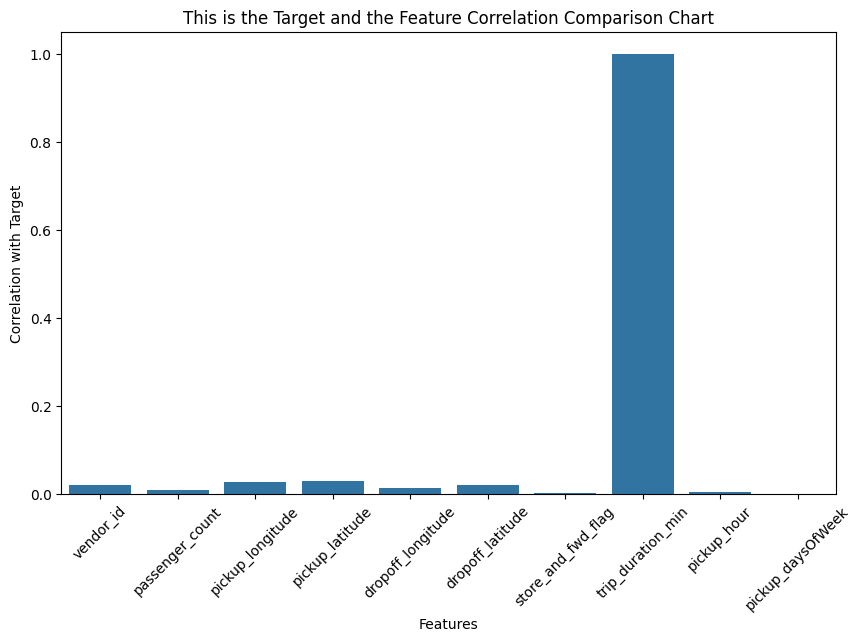

In [163]:
targetFeature = Comparison(df)

In [164]:
targetFeature

{'trip_duration_min': [{'trip_duration_min': '1.00'}]}

In [165]:
def detectVIF(df, threshold=5.0, target_col='trip_duration'):
    from statsmodels.tools.tools import add_constant
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    df = df.drop(columns=[target_col])
    df_with_constant = add_constant(df)

    featureColumns = df.columns
    vifValues = []

    for i in range(df_with_constant.shape[1]):
        vif = variance_inflation_factor(df_with_constant.values, i)
        vifValues.append(vif)

    vif_data = pd.DataFrame()
    vif_data['Features'] = df_with_constant.columns
    vif_data['values'] = vifValues

    vif_data = vif_data[vif_data['Features'] != 'const']

    high_vif_values = []
    vifdatavalues = []

    for i in range(len(vif_data)):
        feature = vif_data.iloc[i]['Features']
        value = vif_data.iloc[i]['values']
        vifdatavalues.append({feature: value})
        if value > threshold:
            high_vif_values.append({feature: value})

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=vif_data, x='Features', y='values')
    plt.xticks(rotation=45)
    plt.title("VIF for Features (Multicollinearity Check)")
    plt.xlabel("Features")
    plt.ylabel("VIF Value")
    plt.show()

    return high_vif_values, vifdatavalues


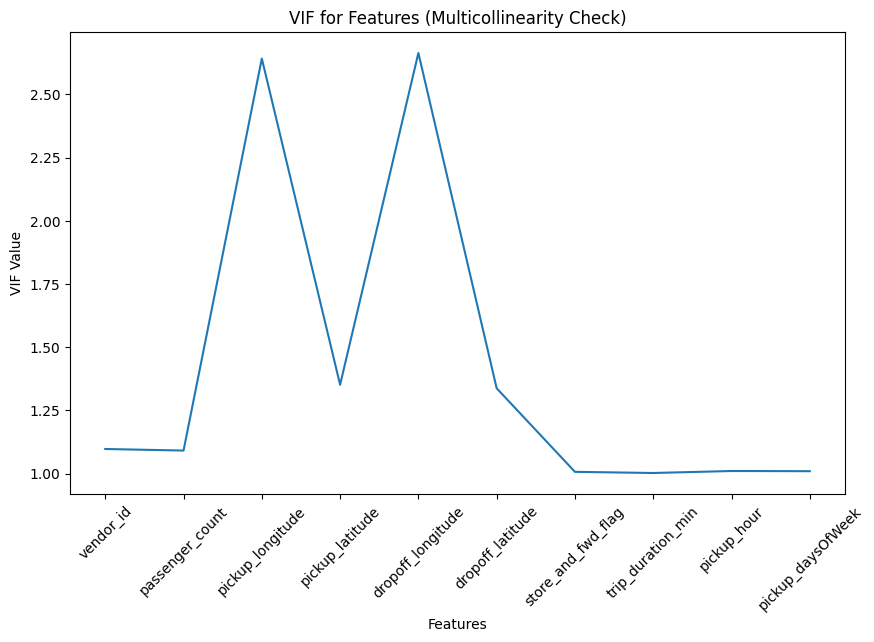

In [166]:
highVifValues = detectVIF(df)

In [167]:
highVifValues

([],
 [{'vendor_id': np.float64(1.097143031936673)},
  {'passenger_count': np.float64(1.0909060691566668)},
  {'pickup_longitude': np.float64(2.6419825792658327)},
  {'pickup_latitude': np.float64(1.3512977094859933)},
  {'dropoff_longitude': np.float64(2.6639183666521005)},
  {'dropoff_latitude': np.float64(1.33729908577739)},
  {'store_and_fwd_flag': np.float64(1.0067129535185688)},
  {'trip_duration_min': np.float64(1.002157765959874)},
  {'pickup_hour': np.float64(1.0100025255148704)},
  {'pickup_daysOfWeek': np.float64(1.0093187241571795)}])

In [168]:
df['trip_duration_binned'] = pd.qcut(df['trip_duration'], q=10, labels=False)

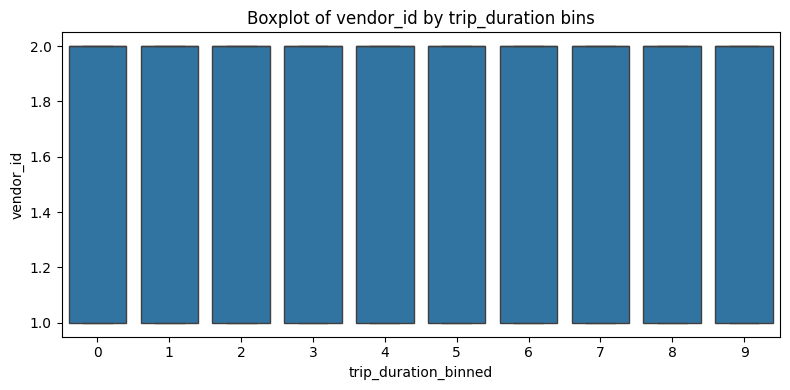

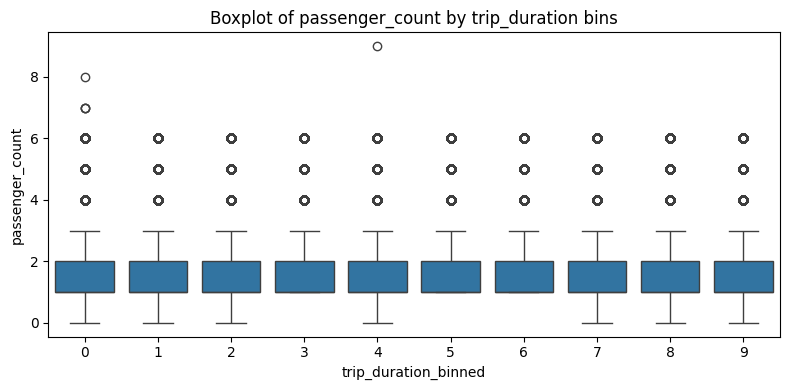

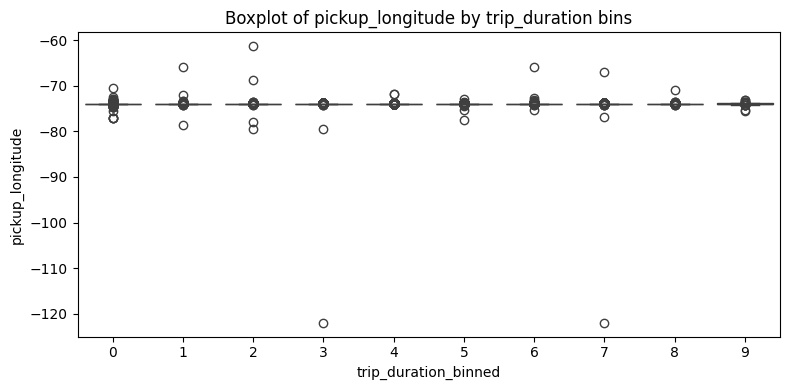

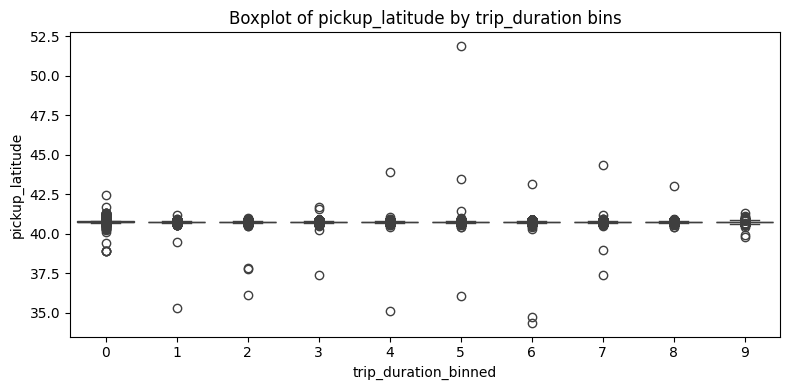

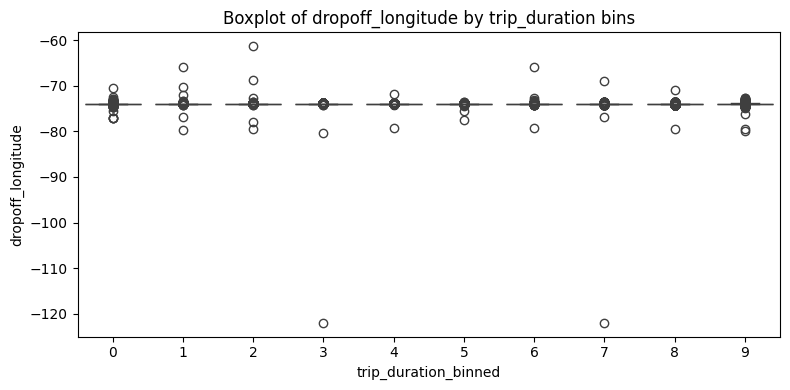

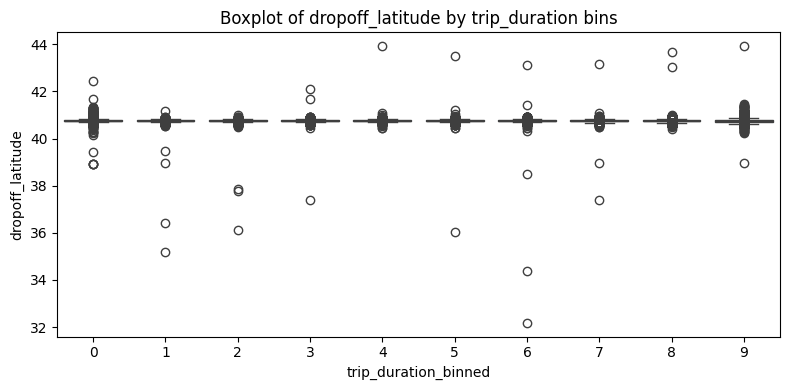

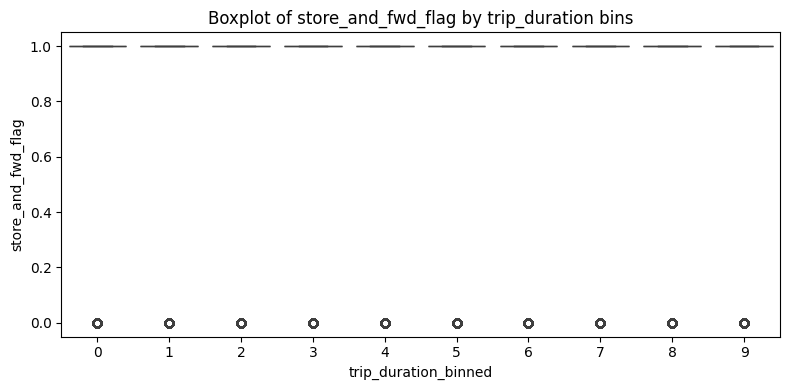

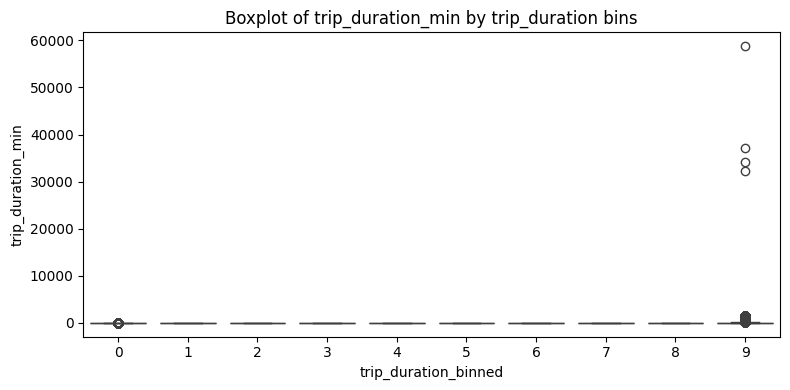

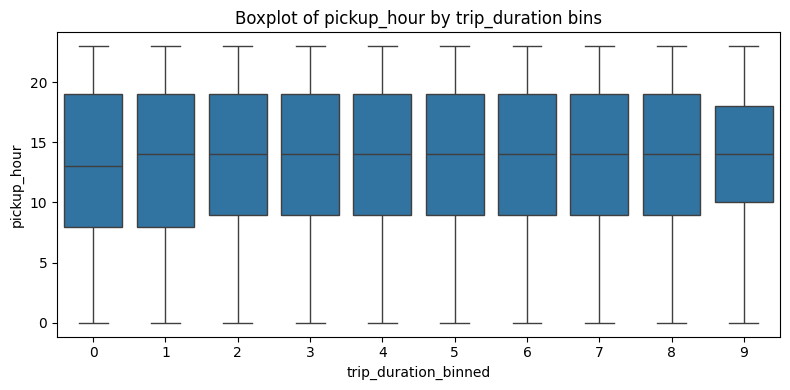

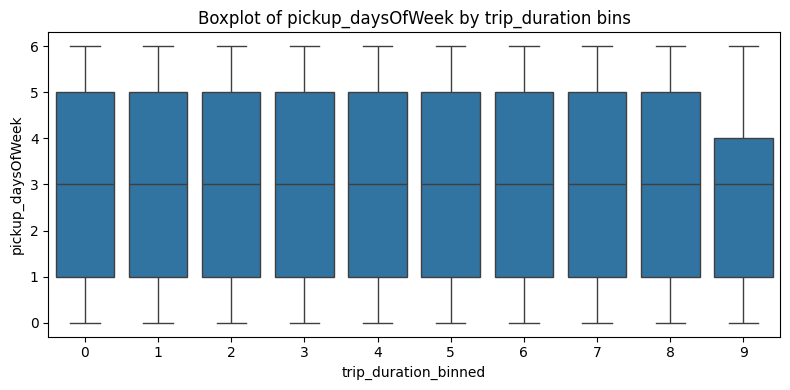

In [170]:
for column in df.columns:
    if column not in ['trip_duration', 'trip_duration_binned']:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x='trip_duration_binned', y=column, data=df)
        plt.title(f'Boxplot of {column} by trip_duration bins')
        plt.tight_layout()
        plt.show()

In [171]:
def remove_outliers_iqr(df, target_column='target'):
    df_clean = df.copy()
    features = [col for col in df.columns if col != target_column]

    for feature in features:
        Q1 = df_clean[feature].quantile(0.25)
        Q3 = df_clean[feature].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df_clean = df_clean[(df_clean[feature] >= lower_bound) & (df_clean[feature] <= upper_bound)]

    return df_clean


In [172]:
dataset = remove_outliers_iqr(df, target_column='trip_duration')

In [190]:
tempdf = pd.DataFrame({
    'Dataset': [ 'df','dataset', 'reduced_count'],
    'Rows': [ df.shape[0], dataset.shape[0], abs(dataset.shape[0] - df.shape[0])],
})

tempdf

,Dataset,Rows
0,df,1458644
1,dataset,1079036
2,reduced_count,379608


In [191]:
percentage_removed = 100 - (dataset.shape[0] / df.shape[0]) * 100
print(f"Percentage Removed : {percentage_removed:.2f}%")

Percentage Removed : 26.02%


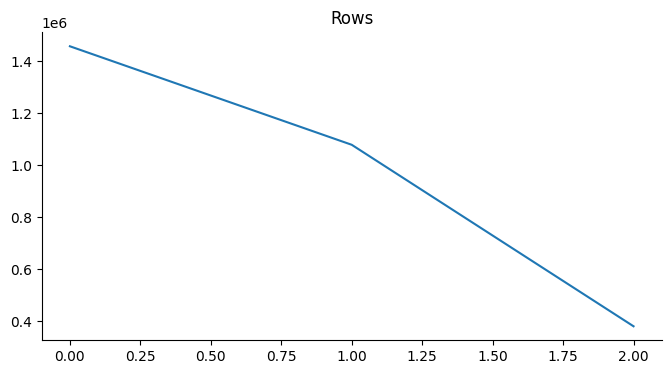

In [187]:
tempdf['Rows'].plot(kind='line', figsize=(8, 4), title='Rows')
plt.gca().spines[['top', 'right']].set_visible(False)

((array([-4.84209823, -4.66285511, -4.56596451, ...,  4.56596451,
          4.66285511,  4.84209823]),
  array([   1,    1,    1, ..., 1745, 1745, 1745])),
 (np.float64(361.4204424855547),
  np.float64(652.6110973127865),
  np.float64(0.9745929251542362)))

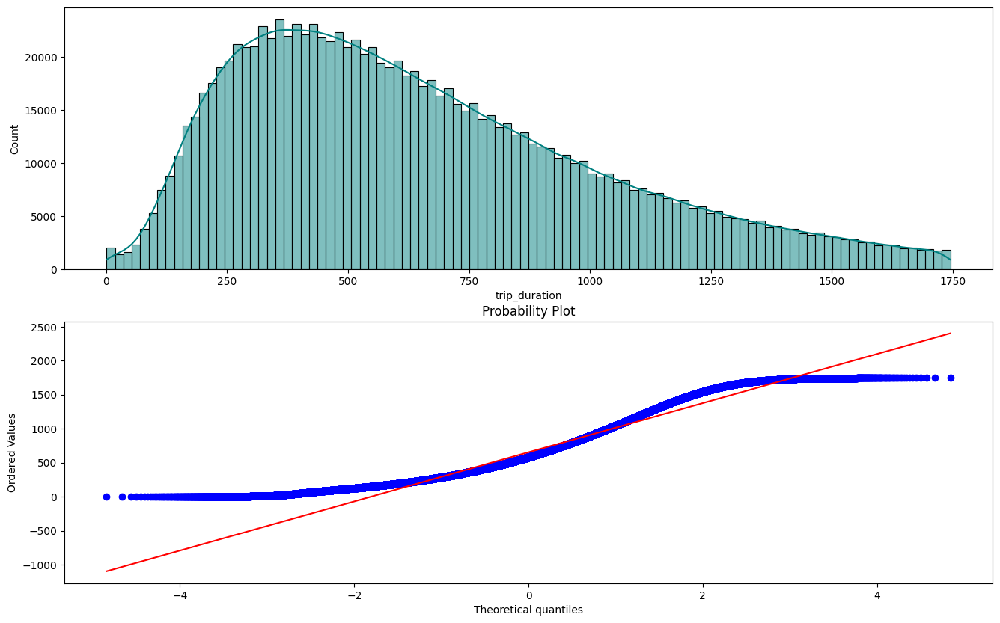

In [194]:
from scipy.stats import probplot

plt.figure(figsize=(16, 10))
plt.subplot(2, 1, 1)
sns.histplot(dataset['trip_duration'], kde=True, color='teal', bins=100)

plt.subplot(2, 1, 2)
probplot(dataset['trip_duration'], dist='norm', plot=plt)

((array([-4.84209823, -4.66285511, -4.56596451, ...,  4.56596451,
          4.66285511,  4.84209823]),
  array([0.        , 0.        , 0.        , ..., 3.24179543, 3.24179543,
         3.24179543])),
 (np.float64(0.28334600260135906),
  np.float64(2.7333276807656657),
  np.float64(0.9739772355613758)))

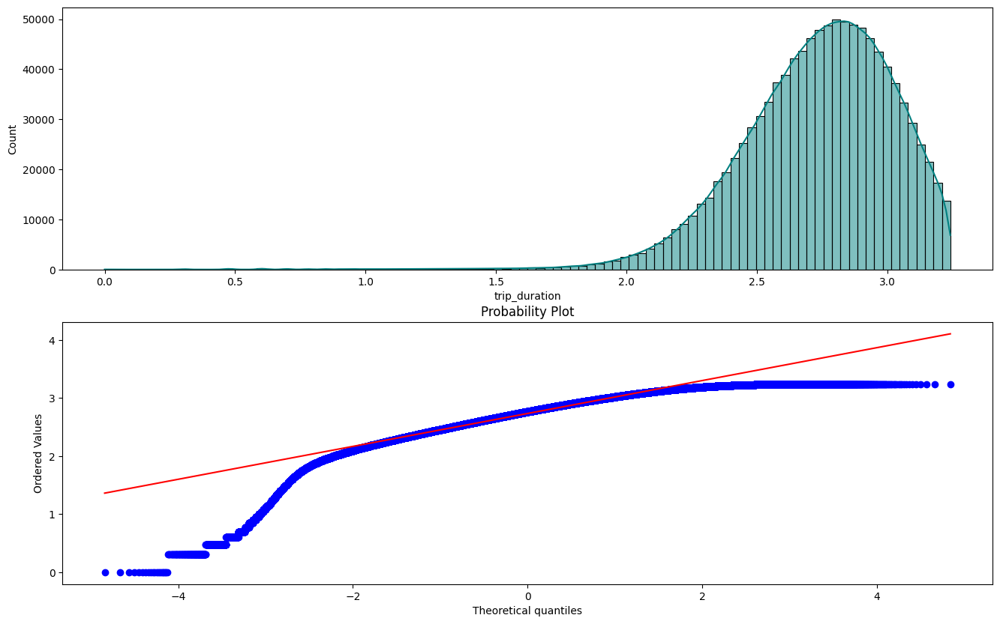

In [206]:
import numpy as np

plt.figure(figsize=(16, 10))
df_log = np.log10(dataset['trip_duration'])

plt.subplot(2, 1, 1)
sns.histplot(df_log, kde=True, color='teal', bins=100)

plt.subplot(2, 1, 2)
probplot(df_log, dist='norm', plot=plt)

In [207]:
dataset.columns

Index(['vendor_id', 'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration', 'trip_duration_min', 'pickup_hour',
       'pickup_daysOfWeek', 'trip_duration_binned'],
      dtype='object')

In [208]:
from sklearn.model_selection import train_test_split

X = dataset.drop(columns=['trip_duration'])
y = df_log

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [209]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [210]:
from sklearn.linear_model import LinearRegression

lin_model = LinearRegression()
lin_model.fit(X_train_scaled, y_train)


LinearRegression()

In [211]:
from sklearn.linear_model import Ridge

ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train_scaled, y_train)


Ridge()

In [212]:
from sklearn.linear_model import Lasso

lasso_model = Lasso(alpha=0.01)
lasso_model.fit(X_train_scaled, y_train)


Lasso(alpha=0.01)

In [213]:
from sklearn.metrics import mean_squared_error, r2_score

for name, model in [('Linear', lin_model), ('Ridge', ridge_model), ('Lasso', lasso_model)]:
    y_pred = model.predict(X_test_scaled)
    rmse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"{name} Regression → RMSE: {rmse:.4f}, R²: {r2:.4f}")


Linear Regression → RMSE: 0.0109, R²: 0.8716
Ridge Regression → RMSE: 0.0109, R²: 0.8716
Lasso Regression → RMSE: 0.0110, R²: 0.8701
